## Split clustering

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import numpy as np 
import pandas as pd
import scanpy as sc
from datetime import datetime

In [163]:
## import utils
cwd = '../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils

In [77]:
import time

In [99]:
save_path = '/nfs/team205/ed6/data/Fetal_immune/'
suffix = 'PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118'

s = "MEM_PROGENITORS"

adata_name = save_path + "{}.{}.h5ad".format(suffix, s)
sdata = sc.read_h5ad(adata_name)

In [164]:
sdata_pp = panfetal_utils.pfi_preprocess(sdata, how="")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing runtime:  99.50940465927124


In [82]:
new_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.full_obs.csv", index_col=0)


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (10,17,18,20,21) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [165]:
sdata_pp.obs = new_obs.loc[sdata.obs_names]

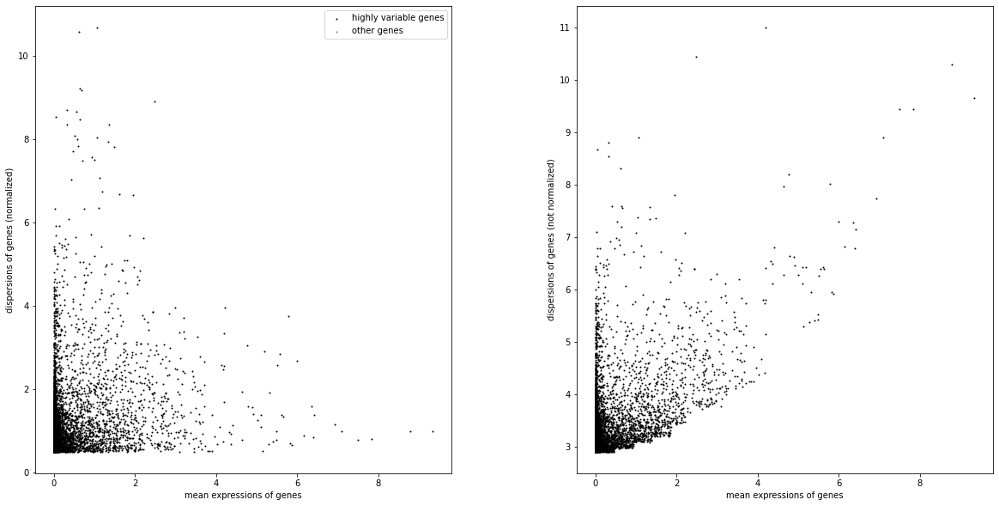

In [166]:
sc.pl.highly_variable_genes(sdata_pp)

## Without ridge regression

In [ ]:
panfetal_utils.pfi_clustering(sdata_pp, how="p", use_highly_variable = False)

In [ ]:
sc.pp.neighbors(sdata_pp)
sc.tl.umap(sdata_pp)

In [ ]:
sc.pl.umap(sdata_pp, color=["method", "donor", "organ"])

## With ridge regression

In [167]:
## Ridge regression
start=time.time()
panfetal_utils.ridge_regression(sdata_pp, batch_key=['method','donor','organ'],confounder_key=['uniform_label'])
v2_time = time.time() - start
print("Ridge regression runtime: ", str(v2_time))

sdata_pp.X = sdata_pp.layers['X_remain']
del sdata_pp.layers['X_remain']
del sdata_pp.layers['X_explained']

Ridge regression runtime:  78.43882822990417


... storing 'Sample' as categorical
... storing 'donor' as categorical
... storing 'organ' as categorical
... storing 'method' as categorical
... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'batch' as categorical
... storing 'bbk' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical


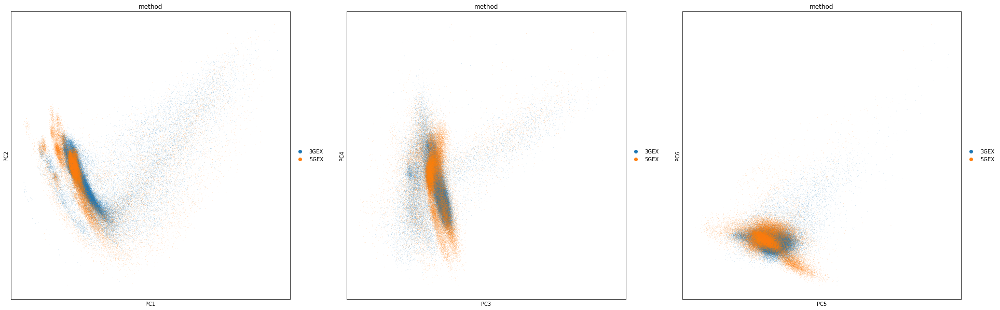

In [168]:
panfetal_utils.pfi_clustering(sdata_pp, how="p", use_highly_variable = False)

In [169]:
sc.pp.neighbors(sdata_pp)
sc.tl.umap(sdata_pp)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../home/jovyan/.local/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
/home/jovyan/.local/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


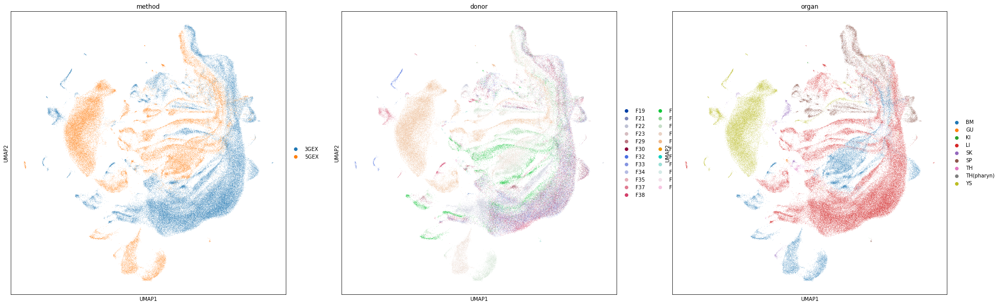

In [170]:
sc.pl.umap(sdata_pp, color=["method", "donor", "organ"])

In [171]:
sdata_pp_bbknn = sdata_pp[sdata_pp.obs['bbk'].isin(sdata_pp.obs["bbk"].value_counts().index[sdata_pp.obs["bbk"].value_counts() > 20])]

In [176]:
import scanpy.external as sce
sdata_pp.obs['bbk'] = [x+y+z for x,y,z in zip(sdata_pp.obs['donor'],sdata_pp.obs['method'],sdata_pp.obs['organ'])]

In [181]:
sdata_pp.obs["bbk"].value_counts()[-30:]

F305GEXSP            45
F193GEXLI            42
F345GEXLI            39
F233GEXTH            37
F455GEXTH            34
F223GEXYS            32
F453GEXTH            31
F645GEXTH            30
F213GEXTH            29
F295GEXSP            22
F193GEXSK            21
F413GEXKI            20
F413GEXTH            19
F333GEXSK            17
F455GEXKI            15
F223GEXTH            13
F415GEXSK            13
F353GEXKI            12
F353GEXSK            12
F415GEXKI            11
F455GEXSK            11
F453GEXSK            10
F415GEXTH             9
F343GEXSK             7
F323GEXTH(pharyn)     6
F413GEXSK             3
F385GEXTH             3
F305GEXTH             3
F293GEXTH             2
F295GEXTH             1
Name: bbk, dtype: int64

In [182]:
sdata_pp_bbknn = sdata_pp[sdata_pp.obs['bbk'].isin(sdata_pp.obs["bbk"].value_counts().index[sdata_pp.obs["bbk"].value_counts() > 10])]

sce.pp.bbknn(sdata_pp_bbknn, batch_key="bbk", n_pcs=30)

Trying to set attribute `.uns` of view, copying.
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/bbknn/__init__.py:289: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/bbknn/__init__.py:290: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


In [183]:
sc.tl.umap(sdata_pp_bbknn)

... storing 'bbk' as categorical


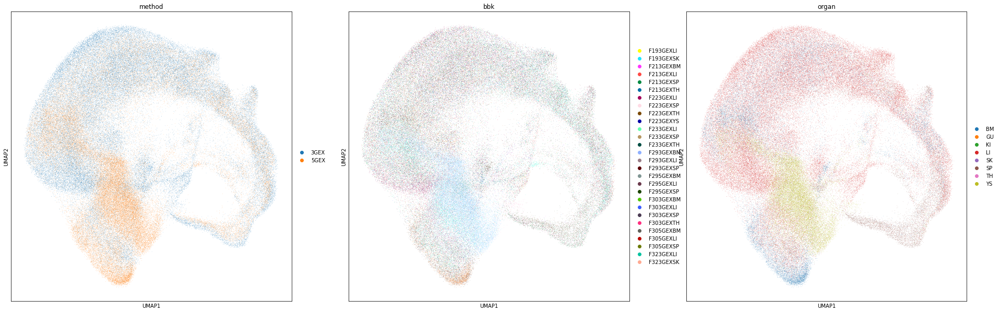

In [184]:
sc.pl.umap(sdata_pp_bbknn, color=["method", "bbk", "organ"])

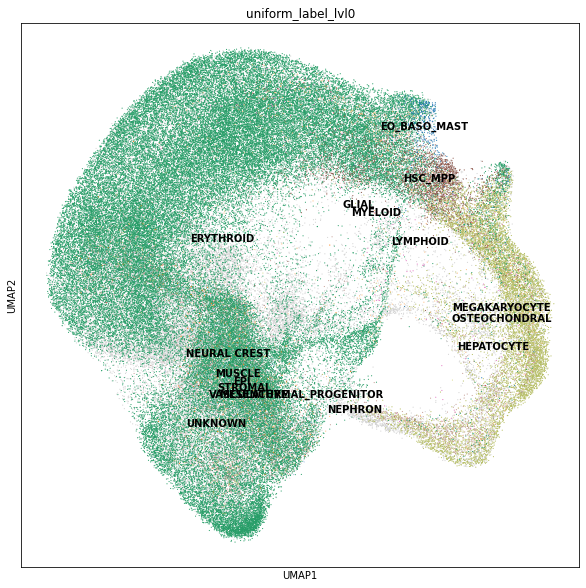

In [185]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.umap(sdata_pp_bbknn, color=["uniform_label_lvl0"], groups=sdata_pp_bbknn.obs["uniform_label_lvl0"][sdata_pp_bbknn.obs["uniform_label_lvl0"]!="nan"].unique(), size=5,
          legend_loc="on data")

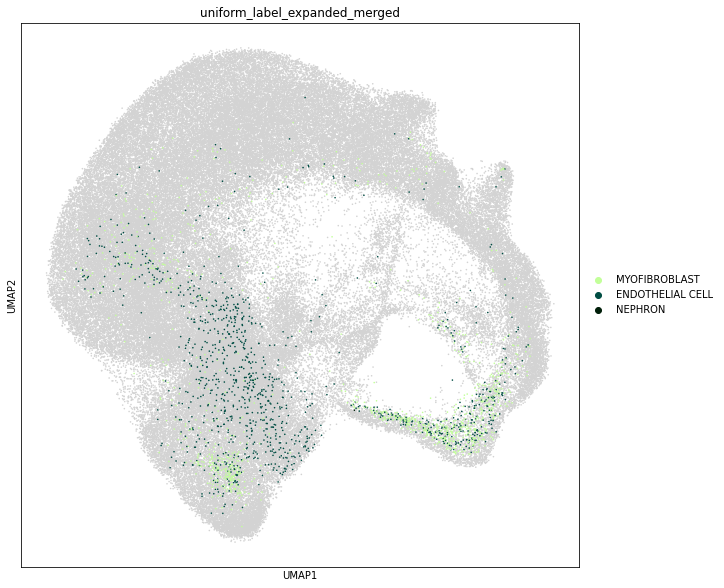

In [186]:
sc.pl.umap(sdata_pp_bbknn, color=["uniform_label_expanded_merged"], groups=["MYOFIBROBLAST", "ENDOTHELIAL CELL", "NEPHRON"], size=10)

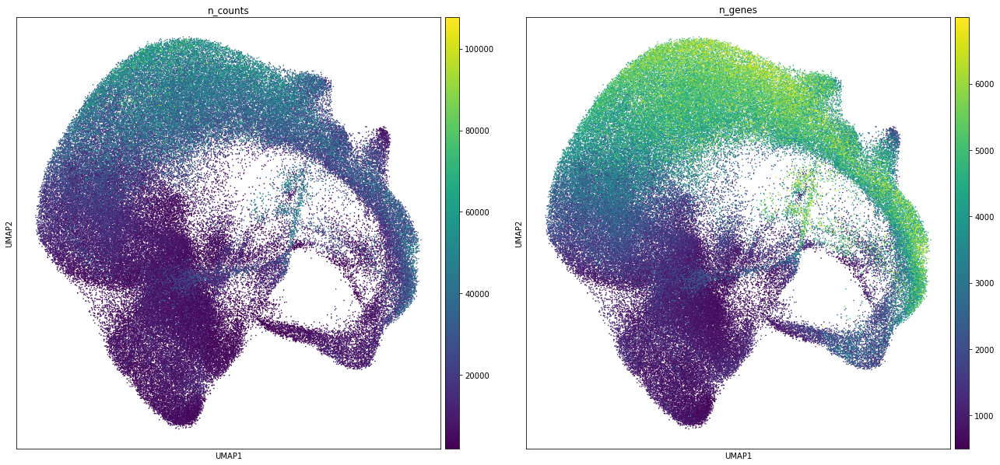

In [188]:
sc.pl.umap(sdata_pp_bbknn, color=["n_counts", "n_genes"], size=10)

In [189]:
sdata_pp_bbknn.obs['sum_rr'] = sdata_pp_bbknn.X.sum(1)

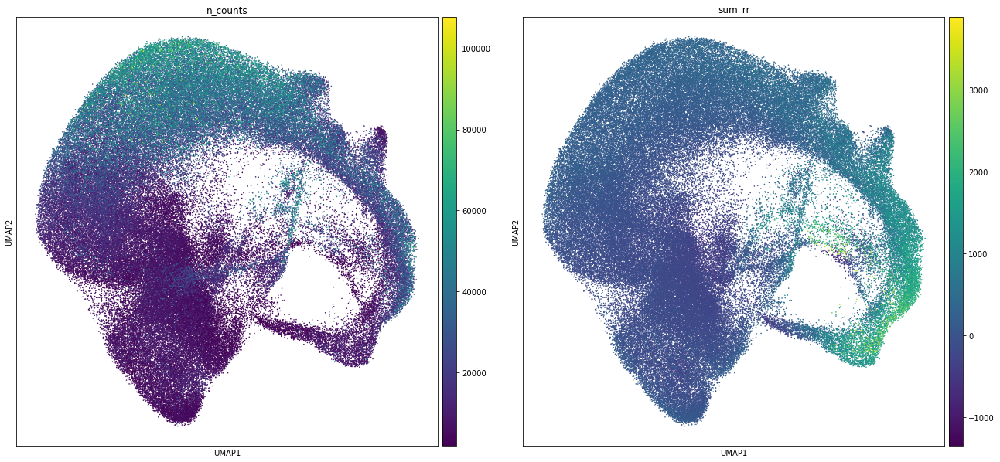

In [190]:
sc.pl.umap(sdata_pp_bbknn, color=["n_counts", "sum_rr"], size=10)

In [191]:
sdata = sdata[sdata_pp_bbknn.obs_names]

In [192]:
sdata.obs = sdata_pp_bbknn.obs.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [193]:
sdata.obsm = sdata_pp_bbknn.obsm

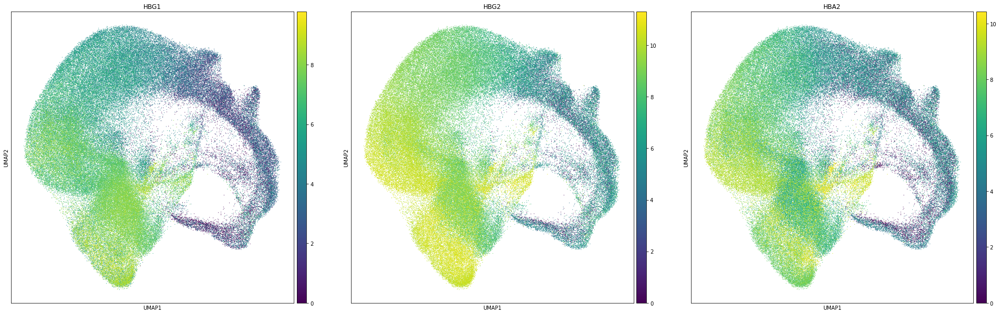

In [194]:
sc.pl.umap(sdata, color=["HBG1", "HBG2", "HBA2"], size=5)

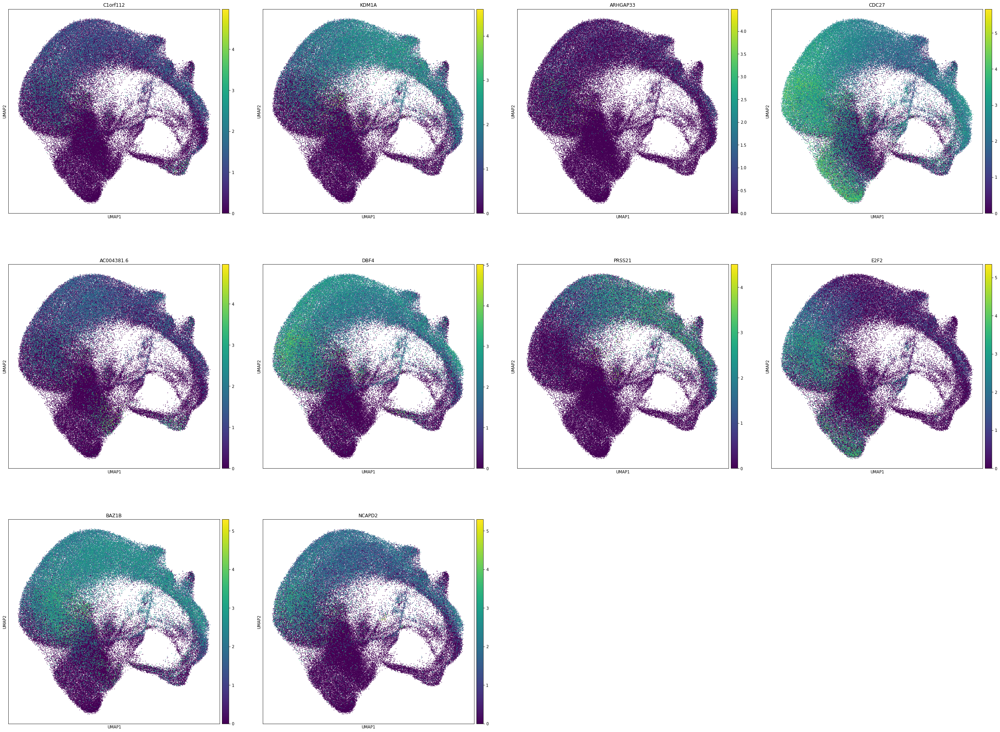

In [195]:
sc.pl.umap(sdata, color=panfetal_utils.cc_genes[0:10], size=10)

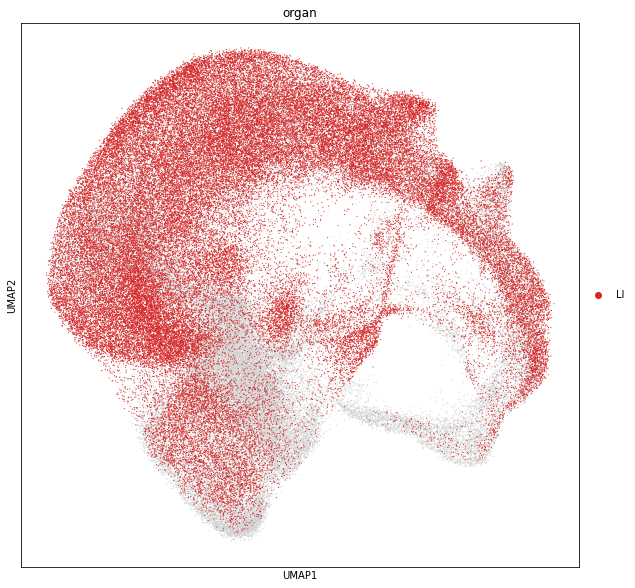

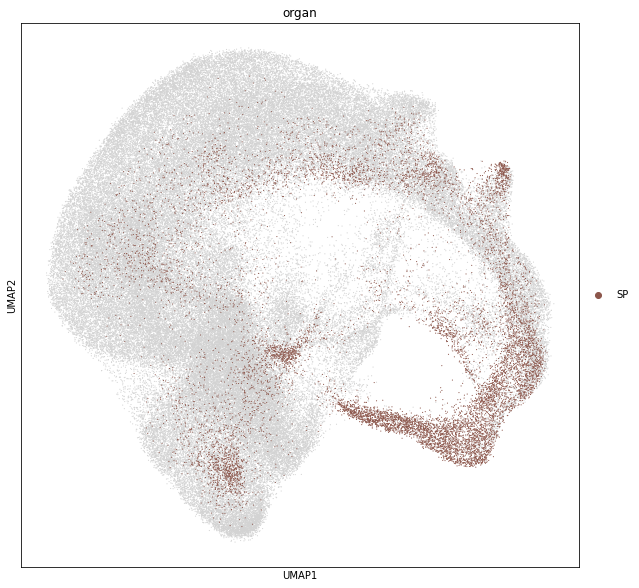

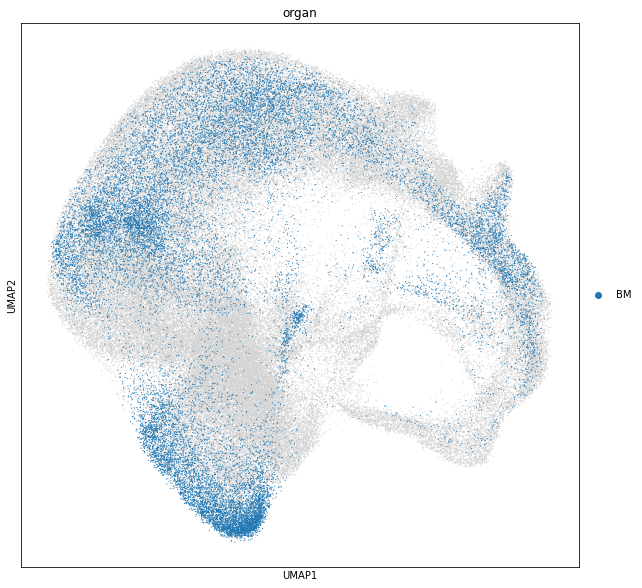

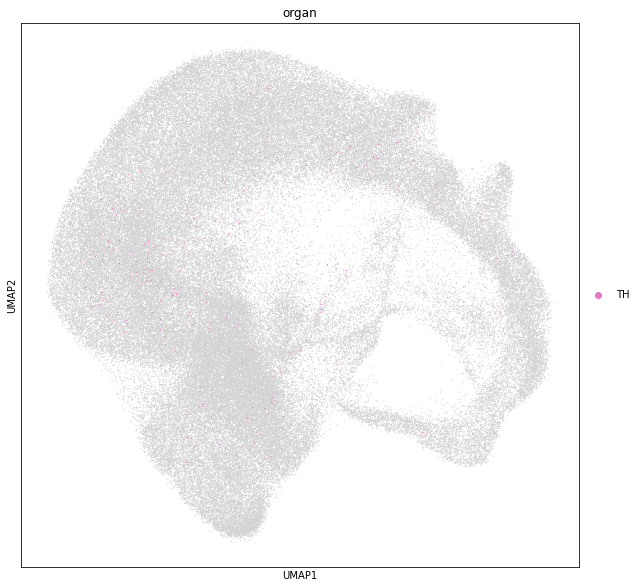

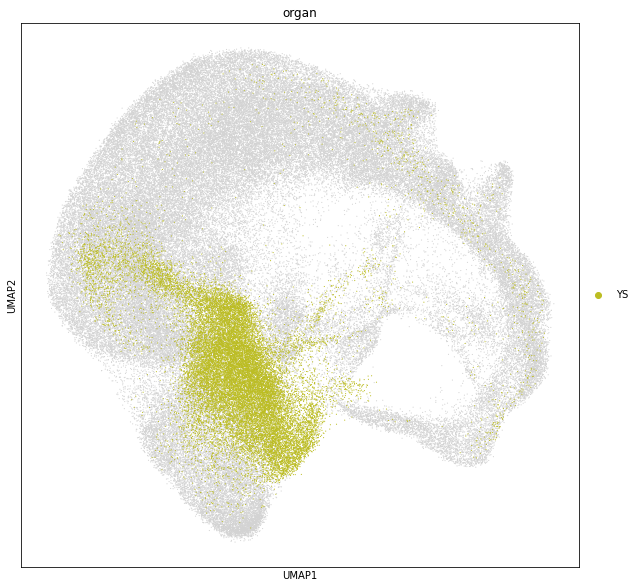

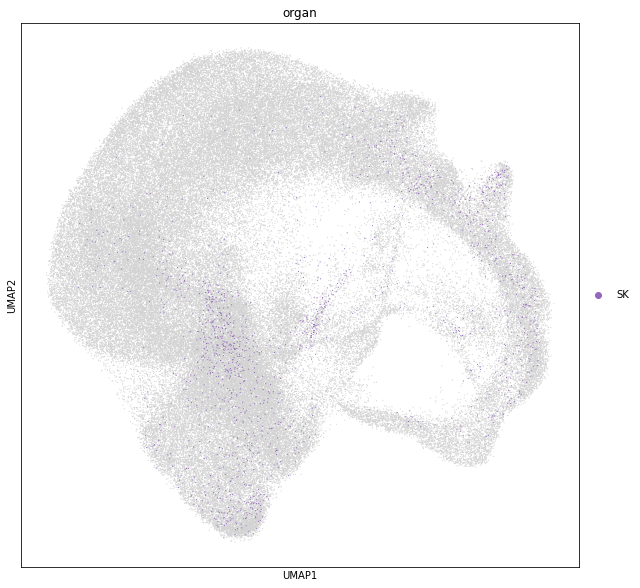

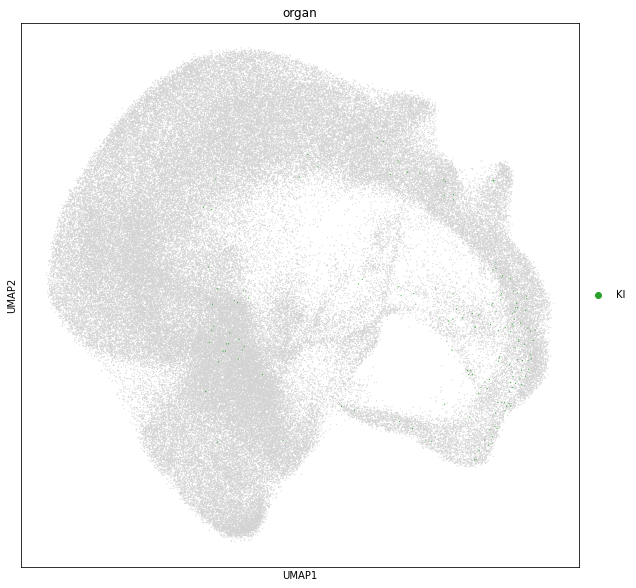

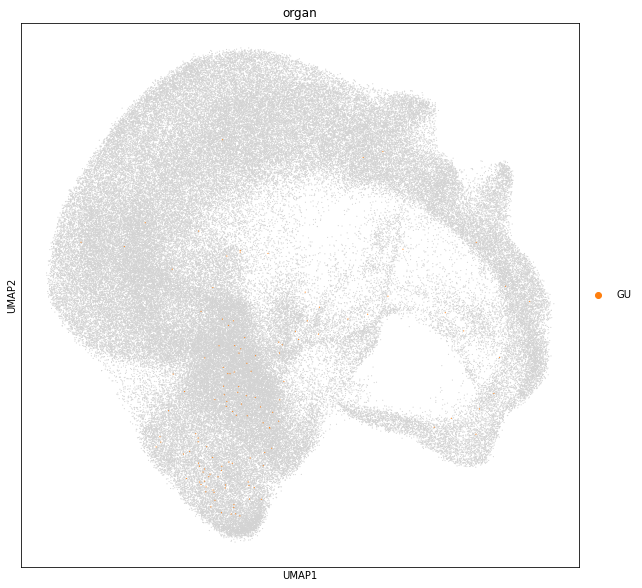

In [196]:
for o in sdata.obs["organ"].unique():
    sc.pl.umap(sdata_pp_bbknn, color=["organ"], groups=o, size=5)

In [96]:
adata_out_name = save_path + "{}.{}.batchCorrected.h5ad".format(suffix, s)

adata_out_name

### Playing with transition matrices

In [80]:
adata.obsp["transition"] = ck.transition_matrix

In [92]:
adata.obs_names = adata_raw.obs_names

In [147]:
mean_trans_mat = []

for age in adata.obs["age"][~np.isnan(adata.obs["age"])].unique():
    age_ix = np.where(adata.obs["age"]==age)[0]
    mean_trans_mat.append(ck.transition_matrix[age_ix,:].mean(0))

In [153]:
mean_trans_mat = np.array(mean_trans_mat).reshape(np.array(mean_trans_mat).shape[0],np.array(mean_trans_mat).shape[2])

In [155]:
mean_mean_trans_mat = []
for age in adata.obs["age"][~np.isnan(adata.obs["age"])].unique():
    age_ix = np.where(adata.obs["age"]==age)[0]
    mean_mean_trans_mat.append(mean_trans_mat[:,age_ix].mean(1))


In [160]:
age_trans_df = pd.DataFrame(np.array(mean_mean_trans_mat), columns=adata.obs["age"][~np.isnan(adata.obs["age"])].unique(),
                           index=adata.obs["age"][~np.isnan(adata.obs["age"])].unique())

<AxesSubplot:>

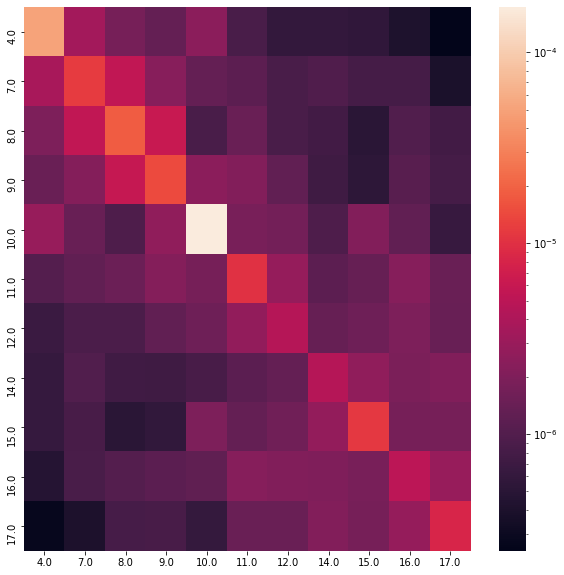

In [169]:
import matplotlib
sns.heatmap(age_trans_df.loc[age_trans_df.columns.sort_values(),age_trans_df.columns.sort_values()], norm=matplotlib.colors.LogNorm())

---

In [59]:
adata = sdata_pp.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [65]:
batch_key=["organ", "donor", "method"]
confounder_key=["uniform_label"]
chunksize = 1e08

In [63]:
from sklearn.linear_model import Ridge

In [90]:
dummy = pd.get_dummies(adata.obs[batch_key+confounder_key],drop_first=False)
if len(batch_key)>1:
    batch_index = np.logical_or.reduce(np.vstack([dummy.columns.str.startswith(x) for x in batch_key]))
else:
    batch_index = np.vstack([dummy.columns.str.startswith(x) for x in batch_key])[0]
dm = np.array(dummy)[:,batch_index]

LR = Ridge(fit_intercept=False, alpha=2)
chunkcount = np.ceil(chunksize/adata.shape[0])

In [91]:
import scipy

In [92]:
X_explained = []
X_remain = []
for ind in np.arange(0,adata.shape[1],chunkcount):
    X_exp = adata.X[:,np.int(ind):np.int(ind+chunkcount)] # scaled data
    if scipy.sparse.issparse(X_exp):
        X_exp = X_exp.todense()
    LR.fit(dummy,X_exp)	
    print("score = ", str(LR.score(dummy, X_exp)))
    X_explained.append(dm.dot(LR.coef_[:,batch_index].T))
    X_remain.append(X_exp - X_explained[-1])

X_explained = np.hstack(X_explained)
X_remain = np.hstack(X_remain)
adata.layers['X_remain'] = X_remain
adata.layers['X_explained'] = X_explained

/home/jovyan/.local/lib/python3.7/site-packages/sklearn/base.py:420: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)


score =  0.01424632919528168


/home/jovyan/.local/lib/python3.7/site-packages/sklearn/base.py:420: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)


score =  0.009533760593885802


/home/jovyan/.local/lib/python3.7/site-packages/sklearn/base.py:420: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)


0.009634744903848413